# ECSE 415: Assignment 2
## Imad Dodin | 260713381
### Notes:

* Only libraries installed in the tutorials were used in this assignment - for simplicity, I've frozen them into requirements.txt for the grader's reference.
* Following instructions on the assignment, images and directories are expected to be placed on the same directory as this file and named identically to the starter directory provided. 

### Acknowledgements: 
I refer to code from the class tutorials to accomplish the required tasks. All comments are my own work.

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [23]:
def warpPerspectivePadded(
        imgl, H, imgr_shape):
    """Performs an affine or Euclidean/rigid warp with padding.
    Parameters
    ----------
    imgl : image to be warped i.e. left image
    imgr : shape of static image i.e. shape of central image
    M : `3x3` Homography matrix.
    Returns
    -------
    src_warped : padded and warped source image
    """
    
    src = imgl
    dst_shape = imgr_shape
    M = H
    
    # it is enough to find where the corners of the image go to find
    # the padding bounds; points in clockwise order from origin
    _, src_w = src.shape[:2]
    lin_pts = np.array([
        [0, src_w],
        [0, 0],
        [1, 1]])
    # transform points
    transf_lin_pts = M.dot(lin_pts) #M[:, :2].dot(lin_pts) + M[:, 2].reshape(3, 1)
    transf_lin_pts /= transf_lin_pts[-1:,:]
    
    # find min and max points
    min_x = np.floor(np.min(transf_lin_pts)).astype(int)
    max_x = np.ceil(np.max(transf_lin_pts)).astype(int)

    # add translation to the transformation matrix to shift to positive values
    anchor_x = 0
    transl_transf = np.eye(3,3)
    if min_x < 0:
        anchor_x = -min_x
        transl_transf[0,2] = anchor_x
        
    shifted_transf = transl_transf.dot(M)
    shifted_transf /= shifted_transf[2,2]

    # create padded destination image
    dst_h, dst_w,_ = dst_shape
    dst_pad_w = anchor_x + max(max_x, dst_w)
    src_warped = cv2.warpPerspective(src, shifted_transf, (dst_pad_w, dst_h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)
    return src_warped

## Question 2: Image Stitching
### SIFT Keypoints (Pt. 1)


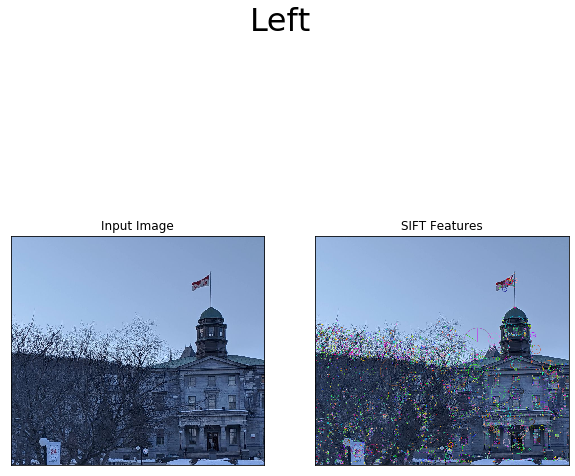

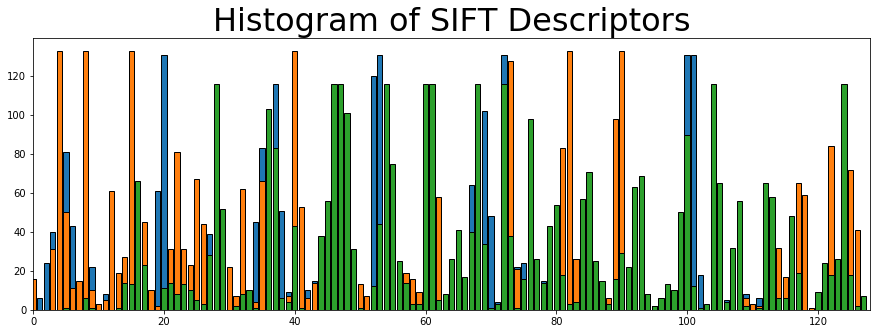

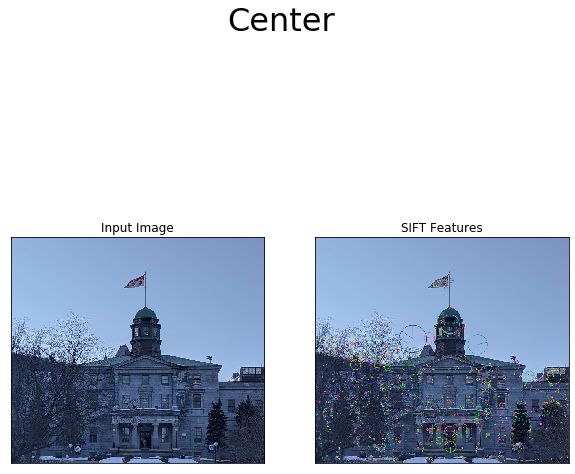

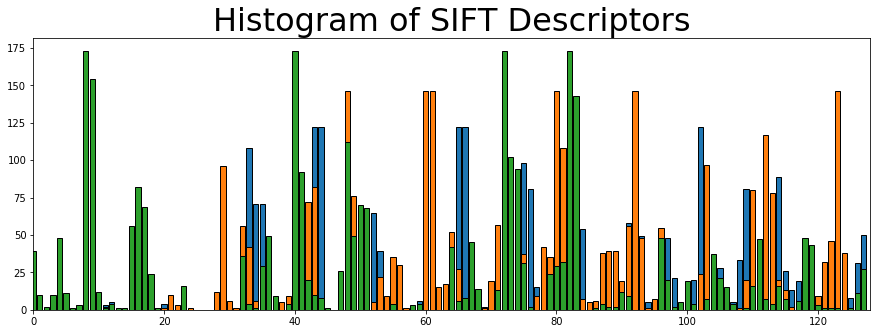

In [33]:
IMAGES = ["left.jpg", "center.jpg"]

def disp(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def computeAndPlotDescriptors(img, keypoints, hist=True):
    # Sift Object
    sift = cv2.xfeatures2d.SIFT_create()
    
    keypoints, descriptors = sift.compute(img, keypoints)
    
    # If render flag is set, render histogram
    if hist:
        num=3
        plt.figure(figsize=(15,5))
        for i in range(num):
            plt.bar(np.arange(0,128), descriptors[i], edgecolor='k')
            plt.xlim([0,128])
            plt.title("Histogram of SIFT Descriptors", fontsize=32)
        plt.show()
    
    return keypoints, descriptors

def computeSiftAndDescriptors(file, render=True, hist=True):
    # Loading and Copying Image
    img = cv2.imread(file)
    img_disp = img.copy()

    # Sift Object
    sift = cv2.xfeatures2d.SIFT_create()

    # Detect SIFT Features
    keypoints = sift.detect(img, None)

    # Draw Keypoints 
    cv2.drawKeypoints(img, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # If Render flag is set, render image + keypoints 
    if render:
        # Render Images
        plt.figure(figsize=(10,10))
        plt.subplot(121), plt.imshow(disp(img))
        plt.title("Input Image"), plt.xticks([]), plt.yticks([])
        plt.subplot(122), plt.imshow(disp(img_disp))
        plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
        plt.suptitle("{}".format(file.split(".")[0].capitalize()), fontsize=32)
        plt.show()
    
    return computeAndPlotDescriptors(img, keypoints, hist)

for file in IMAGES:
    computeSiftAndDescriptors(file)

### Match Keypoints (Pt. 2)

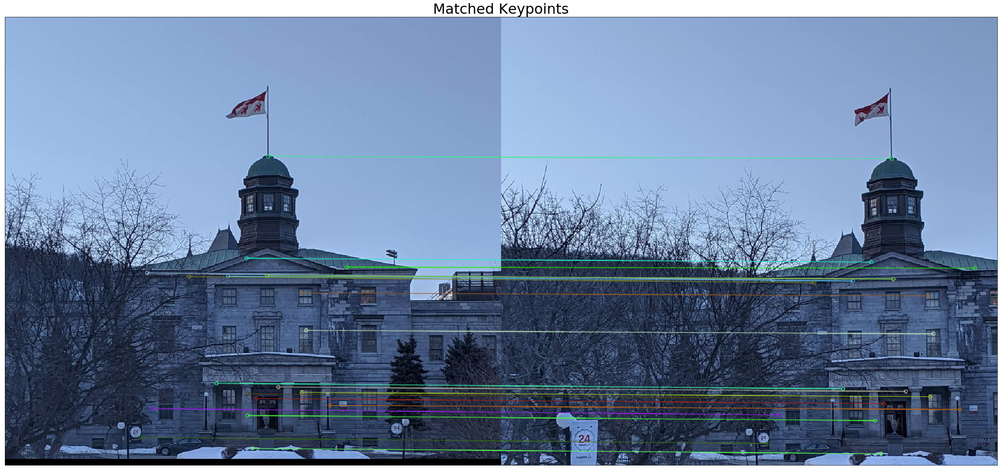

In [34]:
IMAGES = ["left.jpg", "center.jpg"]
LEFT, CENTER = 0, 1
keypoints, descriptors = ["",""], ["",""]

# Compute Sift Keypoints and Descriptors and store into arrays 
for idx, file in enumerate(IMAGES):
    keypoints[idx], descriptors[idx] = computeSiftAndDescriptors(file, render=False, hist=False)
    IMAGES[idx] = cv2.imread(IMAGES[idx])
# Match keypoints 
bf = cv2.BFMatcher()

matches = bf.match(descriptors[CENTER], descriptors[LEFT])

matches = sorted(matches, key = lambda x:x.distance)

imgmatch = cv2.drawMatches(IMAGES[CENTER], keypoints[CENTER], IMAGES[LEFT], keypoints[LEFT], matches[:20], IMAGES[CENTER], flags=2)


plt.figure(figsize=(40,40))
plt.imshow(disp(imgmatch))
plt.title("Matched Keypoints", fontsize=32), plt.xticks([]), plt.yticks([])
plt.show()

### Homography and Stitching (Pts 3-6)

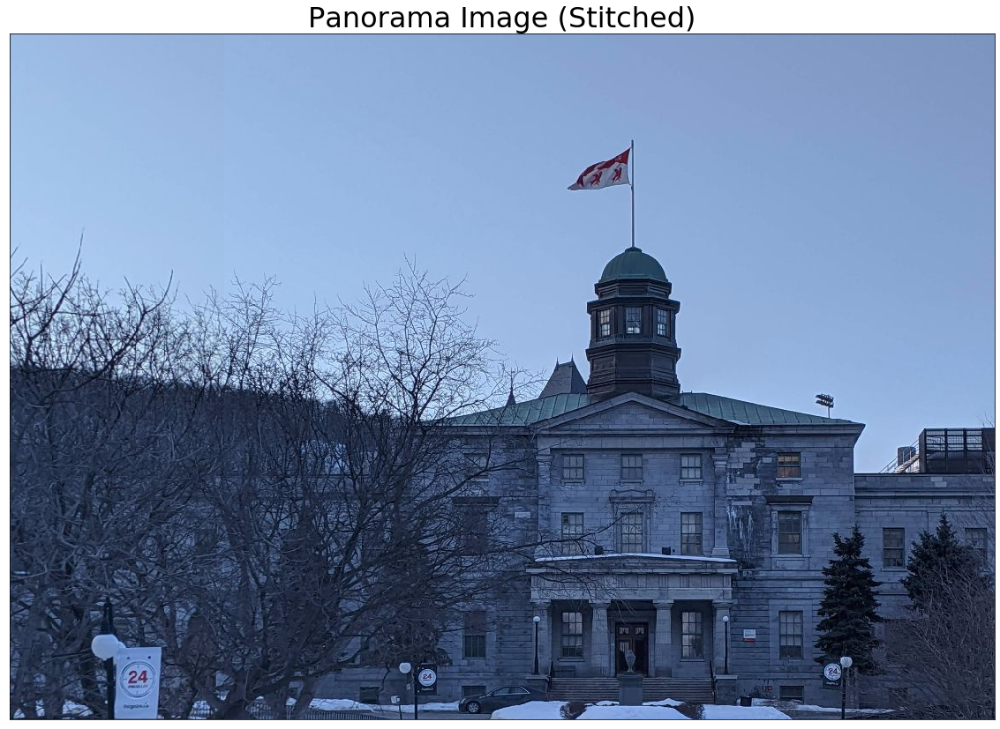

In [35]:

GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 1000:
        GoodMatches.append((m.trainIdx, m.queryIdx))
        
# Keypoints for center and left imagess 
mpc = np.float32([keypoints[CENTER][i].pt for (_, i) in GoodMatches])
mpl = np.float32([keypoints[LEFT][i].pt for (i, _) in GoodMatches])

# Find Homography Points with RANSAC
H, __ = cv2.findHomography(mpl, mpc, cv2.RANSAC, 4)

# Apply perspective warp to left image - use center as static reference
wimg = warpPerspectivePadded(IMAGES[LEFT], H, IMAGES[CENTER].shape)
wimg[:,wimg.shape[1]-IMAGES[CENTER].shape[1]:, :] = IMAGES[CENTER]

plt.figure(figsize=(20,20))
plt.imshow(disp(wimg))
plt.title("Panorama Image (Stitched)", fontsize=32), plt.xticks([]), plt.yticks([])
plt.show()

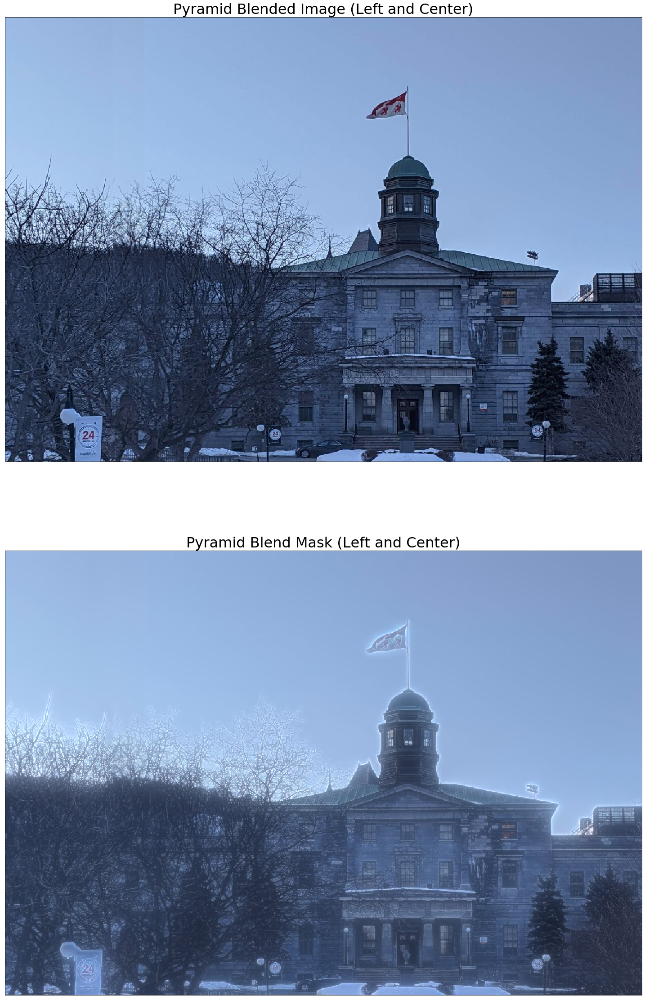

In [36]:
def pyramidBlend(A,B, levels=6, r=2):
    """
    Parameters
    ----------
    A : First Image to be blended
    B : Second Image to be blended
    Returns
    -------
    blended, mask : tuple of blended image and blend mask 
    """

    # Copy A and generate Pyramid of Gaussians
    G = A.copy()
    gpA = [G]
    for i in range(levels):
        G = cv2.pyrDown(G)
        gpA.append(G)
    # Copy B and generate Pyramid of Gaussains
    G = B.copy()
    gpB = [G]
    for i in range(levels):
        G = cv2.pyrDown(G)
        gpB.append(G)
    # Generate Laplacian Pyramid for A
    lpA = [gpA[levels-1]]
    for i in range(levels-1,0,-1):
        size = (gpA[i-1].shape[1], gpA[i-1].shape[0])
        GE = cv2.pyrUp(gpA[i], dstsize = size)
        L = cv2.subtract(gpA[i-1],GE)
        lpA.append(L)
    # generate Laplacian Pyramid for B
    lpB = [gpB[levels-1]]
    for i in range(levels-1,0,-1):
        size = (gpB[i-1].shape[1], gpB[i-1].shape[0])
        GE = cv2.pyrUp(gpB[i], dstsize = size)
        L = cv2.subtract(gpB[i-1],GE)
        lpB.append(L)
    # Stack left (A) and right (B) images 
    LS = []
    for la,lb in zip(lpA,lpB):
        rows,cols,dpt = la.shape
        i = la.shape[0] - lb.shape[0] if la.shape[0] != lb.shape[0] else 0
        if i >= 0:
            ls = np.hstack((la[i:,0:int(cols/r)], lb[:,int(cols/r):]))
        else:
            ls = np.hstack((la[:,0:int(cols/r)], lb[i*-1:,int(cols/r):]))
        LS.append(ls)
    # Reconstruct up Pyramid
    ls_ = LS[0]
    for i in range(1,levels):
        size = (LS[i].shape[1], LS[i].shape[0])
        ls_ = cv2.pyrUp(ls_, dstsize = size)
        ls_ = cv2.add(ls_, LS[i])
    # Stack again and return
    i = A.shape[0] - B.shape[0] if A.shape[0] != B.shape[0] else 0
    if i>= 0:
        real = np.hstack((A[i:,:int(cols/r)],B[:,int(cols/r):]))
    else:
        real = np.hstack((A[:,:int(cols/r)],B[i*-1:,int(cols/r):]))
        
    
    return real, ls_
    
# Compute ratio of stitched image to 
ratio = wimg.shape[1]/(wimg.shape[1] - IMAGES[CENTER].shape[1])
    
imglc, mask = pyramidBlend(IMAGES[LEFT], wimg, r=ratio)
plt.figure(figsize=(40,40))
plt.subplot(211)
plt.imshow(disp(imglc)), plt.xticks([]), plt.yticks([])
plt.title("Pyramid Blended Image (Left and Center)", fontsize=32)
plt.subplot(212)
plt.imshow(disp(mask)), plt.xticks([]), plt.yticks([])
plt.title("Pyramid Blend Mask (Left and Center)", fontsize=32)
plt.show()

### SURF Keypoints / Descriptors and Matching (Pts. 7-8)

In [40]:
IMAGES[LEFT] = imglc.copy()
RIGHT=2
IMAGES.append(cv2.imread("right.jpg"))


def computeAndPlotSurfDescriptors(img, keypoints, hist=True):
    # Surf Object
    surf = cv2.xfeatures2d.SURF_create()
    
    keypoints, descriptors = surf.compute(img, keypoints)
    
    # If render flag is set, render histogram
    if hist:
        num=3
        plt.figure(figsize=(15,5))
        for i in range(num):
            plt.bar(np.arange(0,64), descriptors[i], edgecolor='k')
            plt.xlim([0,64])
            plt.title("Histogram of SURF descriptors", fontsize=32)
        plt.show()
    
    return keypoints, descriptors

def computeSurfAndDescriptors(img, render=True, hist=True):
    img_disp = img.copy()

    # SURF Object
    surf = cv2.xfeatures2d.SURF_create()

    # Detect SURF Features
    keypoints = surf.detect(img, None)

    # Draw Keypoints 
    cv2.drawKeypoints(img, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # If Render flag is set, render image + keypoints 
    if render:
        # Render Images
        plt.figure(figsize=(10,10))
        plt.subplot(121), plt.imshow(disp(img))
        plt.title("Input Image"), plt.xticks([]), plt.yticks([])
        plt.subplot(122), plt.imshow(disp(img_disp))
        plt.title("SURF Features"), plt.xticks([]), plt.yticks([])
        plt.show()
    
    return computeAndPlotSurfDescriptors(img, keypoints, hist)

keypoints = ["","",""]
descriptors = ["","",""]

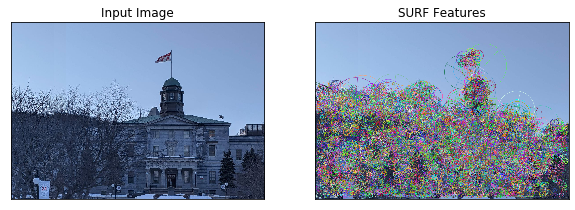

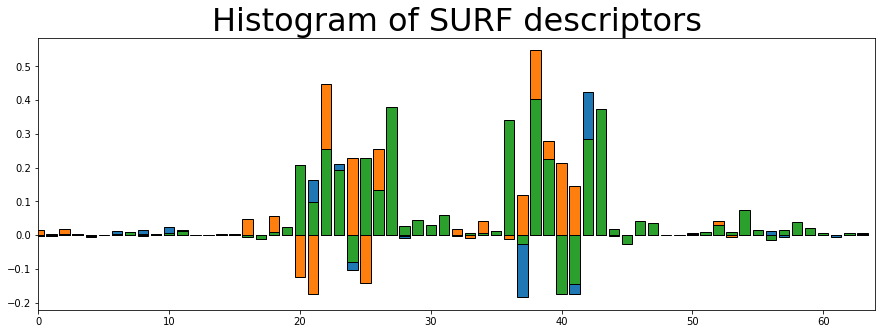

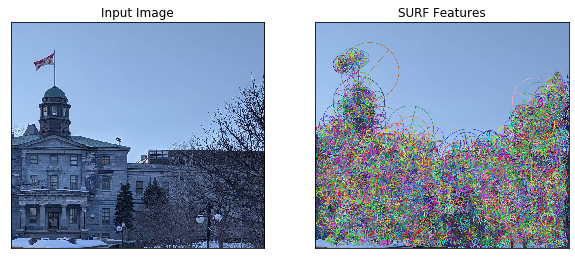

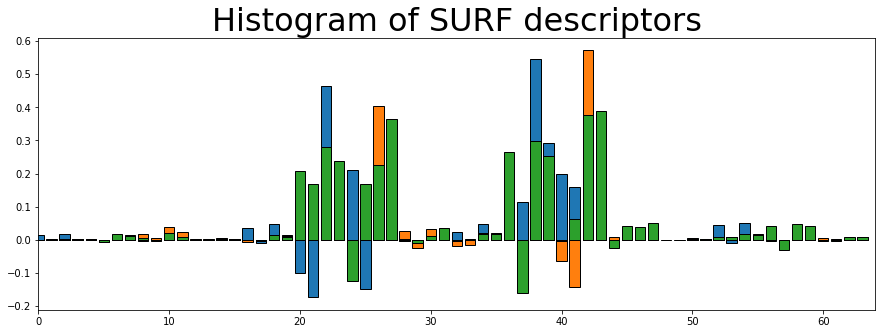

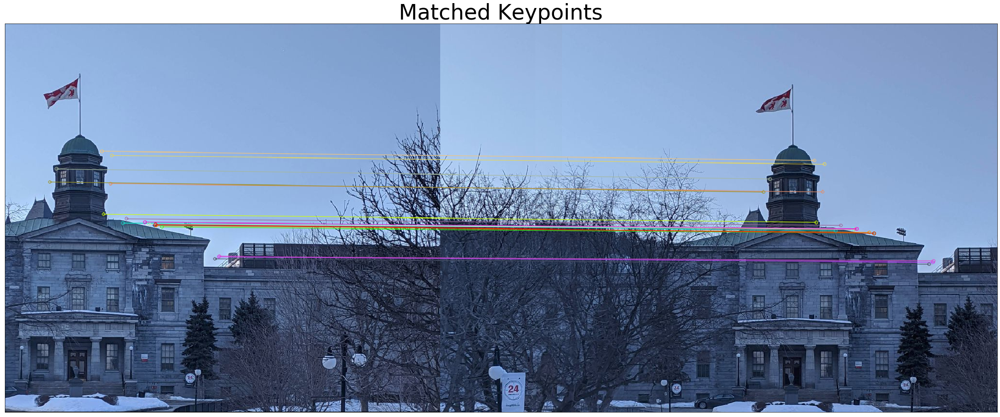

In [42]:
keypoints[LEFT], descriptors[LEFT] = computeSurfAndDescriptors(IMAGES[LEFT])
keypoints[RIGHT], descriptors[RIGHT] = computeSurfAndDescriptors(IMAGES[RIGHT])

bf = cv2.BFMatcher()

matches = bf.match(descriptors[RIGHT], descriptors[LEFT])

matches = sorted(matches, key = lambda x:x.distance)

imgmatch = cv2.drawMatches(IMAGES[RIGHT], keypoints[RIGHT], IMAGES[LEFT], keypoints[LEFT], matches[:20], IMAGES[RIGHT], flags=2)

plt.figure(figsize=(40,40))
plt.imshow(disp(imgmatch))
plt.title("Matched Keypoints", fontsize=48), plt.xticks([]), plt.yticks([])
plt.show()

### Transformation and Homography (Pts 9-10)

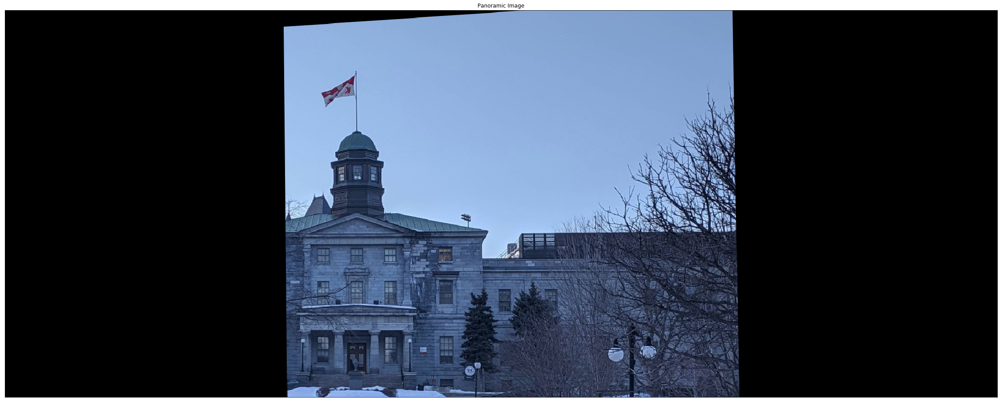

In [43]:
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 1000:
        GoodMatches.append((m.trainIdx, m.queryIdx))
        
mpr = np.float32([keypoints[RIGHT][i].pt for (_,i) in GoodMatches])
mpl = np.float32([keypoints[LEFT][i].pt for (i,_) in GoodMatches])

H, _ = cv2.findHomography(mpr, mpl, cv2.RANSAC, 4)

wimg = cv2.warpPerspective(IMAGES[RIGHT], H, (IMAGES[RIGHT].shape[1] + IMAGES[LEFT].shape[1], IMAGES[RIGHT].shape[0]))

plt.figure(figsize=(40,40))
plt.imshow(disp(wimg))
plt.title("Panoramic Image"), plt.xticks([]), plt.yticks([])
plt.show()

### Stitching and Blending  (Pts 11-12)

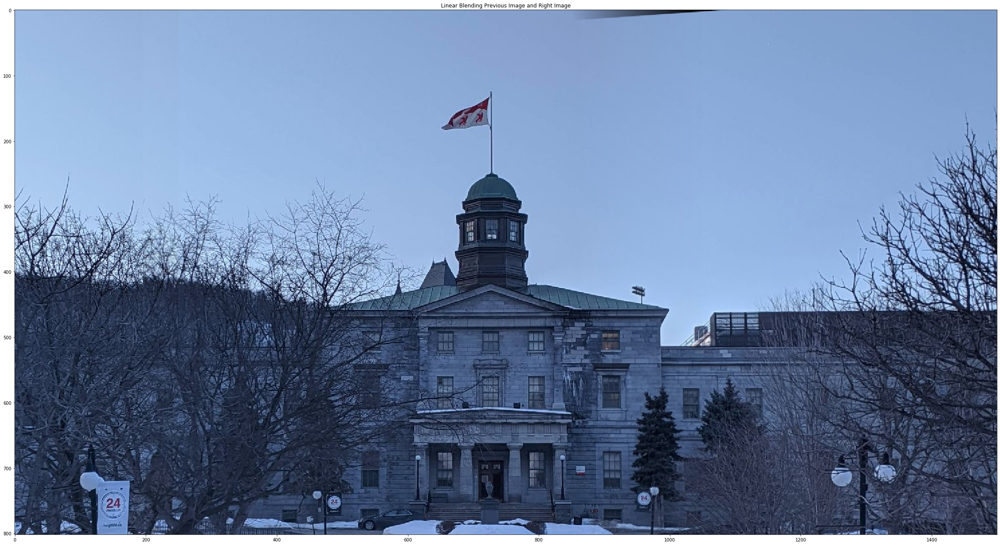

In [44]:
A = IMAGES[LEFT]
B = wimg
B = np.delete(B,np.s_[1500:2051],axis=1)

# Append a black rectangle to the right hand side of the image to fix bugs with linear blending
A = cv2.copyMakeBorder(A, 0, 0, 0, (B.shape[1] - A.shape[1]), cv2.BORDER_CONSTANT, value=0)

col, row = A.shape[0:2]

""" ALPHA BLENDING """
def Ramp(i_width, r_width, r_index, start, end):
    """
    Create alpha blending function
    :param i_width: img width
    :param r_width: ramp width
    :param r_index: center ramp index
    :param start: starting ramp value
    :param end: ending ramp value
    :return:
    """
    a = np.zeros((i_width))
    step = (end - start) / (r_width-1)
    idx = round(r_index - (r_width / 2))  # left side starting index of alpha ramp
    for i in range(r_width):
        a[idx] = start + step*i
        idx += 1
    a[idx:] = 1
    return a


ramp_size = 200
alpha = Ramp(B.shape[1], ramp_size, IMAGES[LEFT].shape[1]-200, 0, 1)

# Blend Images together
blendA = np.uint8((1-alpha.reshape(1,-1,1)) * A[1:,:,:])
blendB = np.uint8(alpha.reshape(1,-1,1)*B)
I_blend = (1-alpha.reshape(1,-1,1)) * A[1:,:,:] + alpha.reshape(1,-1,1)*B
I_blend = np.uint8(I_blend)

plt.figure(figsize=(40,40))
plt.imshow(disp(I_blend))
plt.title('Linear Blending Previous Image and Right Image')
plt.show()

### Pyramid vs Linear Blending (Pt. 13)
#### Linear Blending:
(+) - Linear Blending consists of simple computations that have a significantly lower time complexity than Pyramid Blending - it is faster both with regards to runtime and implementation time. 

(-) - Linear Blending does not handle ghosting well - if we blend with a large kernel, we can note a significant increase in ghosting with linear blending.
#### Pyramid Blending:
(+) - Pyramid Blending handles ghosting significantly better than Linear Blending.
(-) - The computational complexity of Pyramid Blending is significantly higher than that of the linear blend as we must construct several Laplacian layers before taking their difference, this scales up with both input size and layer count. 

## 3. Object Detection
### Resize Training Images (Pt. 1)

In [45]:
def openAndResize(image):
    image = cv2.imread('./train_set/{}'.format(image))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128,128))
    return image

images = [openAndResize(x) for x in os.listdir('./train_set')]    
    

### Compute HoG (Pt. 2)

In [46]:
def getHog(img, cell_size=(4,4), block_size=(2,2), nbins=9):
    """
    Compute HoG for the image.
    :param img: Image to compute HoG
    :param cell_size: Cell Size (default=(4,4))
    :param block_size: Block Size (default=(2,2))
    :param nbins: Number of bins to compute (default=9)
    :return:
    """
    img = cv2.cvtColor(img,
                   cv2.COLOR_BGR2GRAY)

    # create HoG Object
    # winSize is the size of the image cropped to multiple of the cell size
    # all arguments should be given in terms of number of pixels
    hog = cv2.HOGDescriptor(_winSize=(img.shape[1] // cell_size[1] * cell_size[1],
                                      img.shape[0] // cell_size[0] * cell_size[0]),
                            _blockSize=(block_size[1] * cell_size[1],
                                        block_size[0] * cell_size[0]),
                            _blockStride=(cell_size[1], cell_size[0]),
                            _cellSize=(cell_size[1], cell_size[0]),
                            _nbins=nbins)

    n_cells = (img.shape[0] // cell_size[0], img.shape[1] // cell_size[1])

    # Compute HoG features
    hog_feats = hog.compute(img) \
                   .reshape(n_cells[1] - block_size[1] + 1,
                            n_cells[0] - block_size[0] + 1,
                            block_size[1], block_size[0], nbins) \
                   .transpose((1, 0, 3, 2, 4))  # index blocks by rows first
    
    return hog_feats

### Mean Map and Orientations (Pts 3 and 4)

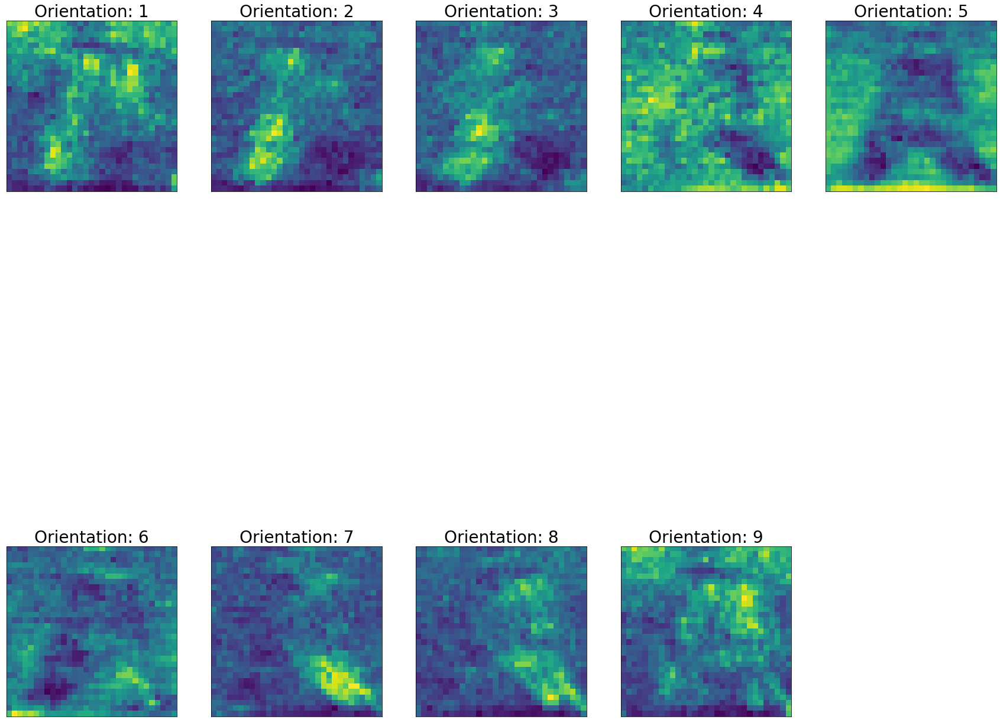

In [47]:
feats = [getHog(x) for x in images]
meanMap = sum(feats) / len(feats)

plt.figure(figsize = (30,30))
for i in range(meanMap.shape[4]):
    plt.subplot("25{}".format(i+1))
    plt.pcolor(meanMap[:,:,0,0,i])
    plt.gca().invert_yaxis()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.title("Orientation: {}".format(i+1), fontsize=28), plt.xticks([]), plt.yticks([])
    
plt.show()

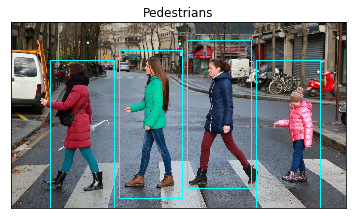

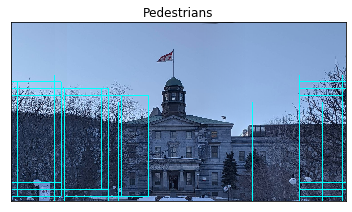

In [20]:
def detect(test, window=(195,450), stride=(30,30), t=18.35):
    # Pass window through image by "Stride" steps
    for col in range(0, test.shape[1] - (window[0] - stride[0]), stride[0]):
        for row in range(0, test.shape[0] - (window[1] - stride[1]), stride[1]):
            # Crop and resize
            snipped = cv2.resize(test[row: row + window[1], col: col + window[0]], (128,128))

            # Get HOG feature for snipped window 
            hog = getHog(snipped)

            # Distance between HoG and Previously Computed Mean (measure of similarity)
            d = cv2.norm(hog, meanMap)

            # If distance is below the threshold, we consider the object detected - draw rectangle
            if (d < t):
                cv2.rectangle(test, (col, row), (col + window[0], row + window[1]), (0, 255, 255), 2)


    plt.imshow(test)
    plt.title("Pedestrians"), plt.xticks([]), plt.yticks([])
    plt.show()
    

# Try with pedestrian test
test= cv2.cvtColor(cv2.imread("test_image.png"),
                   cv2.COLOR_BGR2RGB)
detect(test)

# Try with Panorama
p = disp(I_blend)
detect(p)

#### Testing Performance 

The performance of our HoG model is decent on the test image, after a lengthy process of tuning parameters. I note, however, that when testing on the panorama image generated previously, we detect various trees as pedestrians. I suspect that, by "training" with more images, we have a mean map that is more representative of the actual pedestrian and we would thus reduce the amount of false positives observed. 

I also note that, while fine tuning my parameters, I noticed clusters of detections (i.e. multiple overlapping rectangles around a given pedestrian) - I handled this by increasing the stride to reduce the overlapping "windows" on a given pedestrian, but this would prevent us from being able to detect pedestrians that are close together separately. One could propose that an additional post filtering step be to merge rectangles that are within a given threshold distance (between corners) or that have overlap above a given threshold area. 